<a href="https://colab.research.google.com/github/SaiGayathriGudla-1184/123/blob/main/building_detection_using_u_net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q kaggle patchify segmentation-models-3D

In [ ]:
import os

# 1. Set your credentials directly here
# Replace 'your_username' with your actual Kaggle username
os.environ['KAGGLE_USERNAME'] = "Sai Gayathri_1184"

# Replace with your NEW key (after expiring the leaked one)
os.environ['KAGGLE_KEY'] = "KGAT_42d75bbc6434d084a7589ec5db5f7889"

# 2. Now you can run Kaggle commands normally
!pip install -q kaggle
import kaggle

# 3. Download the dataset (Example: Dubai dataset)
print("Downloading Dataset...")
!kaggle datasets download -d humansintheloop/semantic-segmentation-of-aerial-imagery
!unzip -q semantic-segmentation-of-aerial-imagery.zip
print("Dataset Downloaded!")

Dataset URL: https://www.kaggle.com/datasets/humansintheloop/semantic-segmentation-of-aerial-imagery
License(s): CC0-1.0
semantic-segmentation-of-aerial-imagery.zip: Skipping, found more recently modified local copy (use --force to force download)
replace Semantic segmentation dataset/Tile 1/images/image_part_001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Semantic segmentation dataset/Tile 1/images/image_part_002.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Semantic segmentation dataset/Tile 1/images/image_part_003.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Semantic segmentation dataset/Tile 1/images/image_part_004.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Semantic segmentation dataset/Tile 1/images/image_part_005.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: Dataset Downloaded!


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from tensorflow.keras.optimizers import Adam
from patchify import patchify
from PIL import Image

In [ ]:
# Configuration
root_directory = 'Semantic segmentation dataset'
patch_size = 256

image_dataset = []
mask_dataset = []

images = sorted(os.listdir(os.path.join(root_directory, "Tile 1/images")))
print(f"Processing {len(images)} large tiles. This may take a moment...")

for i, image_name in enumerate(images):
    if image_name.endswith(".jpg"):
        # Load Image
        image = cv2.imread(os.path.join(root_directory, "Tile 1/images", image_name), 1)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        SIZE_X = (image.shape[1]//patch_size)*patch_size
        SIZE_Y = (image.shape[0]//patch_size)*patch_size
        image = Image.fromarray(image)
        image = image.crop((0,0,SIZE_X,SIZE_Y))
        image = np.array(image)

        # Patchify Image
        patches_img = patchify(image, (patch_size, patch_size, 3), step=patch_size)

        # Load Mask
        mask = cv2.imread(os.path.join(root_directory, "Tile 1/masks", image_name.replace(".jpg", ".png")), 1)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = Image.fromarray(mask)
        mask = mask.crop((0,0,SIZE_X,SIZE_Y))
        mask = np.array(mask)

        # Patchify Mask
        patches_mask = patchify(mask, (patch_size, patch_size, 3), step=patch_size)

        for i in range(patches_img.shape[0]):
            for j in range(patches_img.shape[1]):
                single_patch_img = patches_img[i,j,:,:]
                single_patch_mask = patches_mask[i,j,:,:]

                # Normalize image to 0-1
                single_patch_img = single_patch_img[0] / 255.
                single_patch_mask = single_patch_mask[0]

                image_dataset.append(single_patch_img)
                mask_dataset.append(single_patch_mask)

image_dataset = np.array(image_dataset)
mask_dataset = np.array(mask_dataset)

# Convert Hex classes to Integer labels (Building class is usually distinct color)
# For simplicity in this specific dataset, we convert to grayscale discrete class
# Building is often #3C1098. Let's simplify to a binary "Building vs Background" for best detection results.
# In Dubai dataset: Building hex is roughly red channel dominant in many conversions,
# but here is a robust binary conversion:
label = single_patch_mask
# Create a binary mask: 1 for building, 0 for others.
# In this dataset, buildings are a specific purple color. We will simplify the problem to "Building Detection"
# (Note: For multi-class, you would map all 6 colors. Here we target Buildings).
def rgb_to_2D_label(label):
    # This is a simplified map. For precise hex matching, we'd map exact RGB values.
    # Buildings in this dataset are typically purple-ish.
    label_seg = np.zeros(label.shape,dtype=np.uint8)
    label_seg [np.all(label == [60, 16, 152], axis=-1)] = 1 # Building Class
    label_seg = label_seg[:,:,0]  # Just take one channel since it's a mask
    return label_seg

labels = []
for i in range(mask_dataset.shape[0]):
    label = rgb_to_2D_label(mask_dataset[i])
    labels.append(label)

labels = np.array(labels)
labels = np.expand_dims(labels, axis=3)

# SPLIT DATASET
X_train, X_test, y_train, y_test = train_test_split(image_dataset, labels, test_size=0.20, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.50, random_state=42)

print(f"Train Size: {X_train.shape}")
print(f"Val Size: {X_val.shape}")
print(f"Test Size: {X_test.shape}")

Processing 9 large tiles. This may take a moment...
Train Size: (43, 256, 256, 3)
Val Size: (5, 256, 256, 3)
Test Size: (6, 256, 256, 3)


In [ ]:
def simple_unet_model(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    s = inputs

    # Contraction path (Encoder)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    # Expansive path (Decoder)
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

model = simple_unet_model(256, 256, 3)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 256, 256,  │          0 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      2,320 │ dropout[0][0]     │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │      4,640 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 128, 128,  │          0 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │      9,248 │ dropout_1[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 64, 64,    │          0 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │     36,928 │ dropout_2[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 32, 32,    │          0 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │    147,584 │ dropout_3[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 16, 16,    │          0 │ conv2d_7[0][0]  

 Total params: 1,941,105 (7.40 MB)

 Trainable params: 1,941,105 (7.40 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - accuracy: 0.9665 - loss: 0.1266 - val_accuracy: 0.9475 - val_loss: 0.1966
Epoch 2/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.9665 - loss: 0.1145 - val_accuracy: 0.9475 - val_loss: 0.1846
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9665 - loss: 0.1208 - val_accuracy: 0.9475 - val_loss: 0.1725
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9665 - loss: 0.1054 - val_accuracy: 0.9475 - val_loss: 0.1792
Epoch 5/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9665 - loss: 0.1223 - val_accuracy: 0.9475 - val_loss: 0.1967
Epoch 6/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - accuracy: 0.9665 - loss: 0.1173 - val_accuracy: 0.9475 - val_loss: 0.1655
Epoch 7/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9665 - loss: 0.1113 - val_accuracy: 0.9475 - val_loss: 0.1820
Epoch 8/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9665 - loss: 0.1191 - val_accuracy: 0.9475 - val_loss:

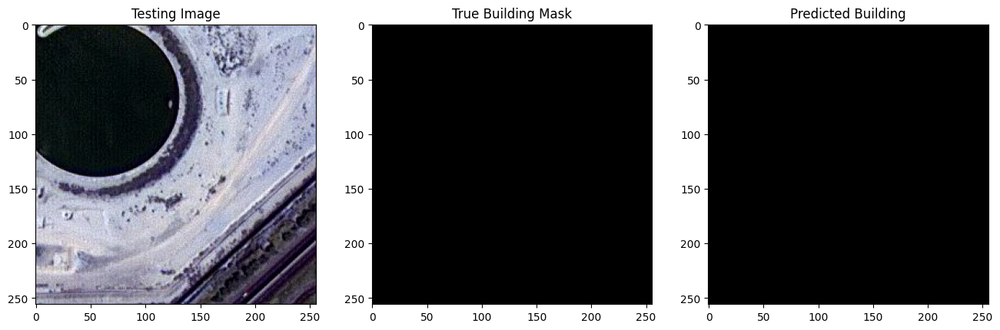

In [ ]:
# Train
history = model.fit(X_train, y_train,
                    batch_size=16,
                    verbose=1,
                    epochs=20,
                    validation_data=(X_val, y_val),
                    shuffle=False)

# Evaluate and Plot Results
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth = y_test[test_img_number]
test_img_input = np.expand_dims(test_img, 0)

prediction = (model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)

plt.figure(figsize=(16, 8))
plt.subplot(131)
plt.title('Testing Image')
plt.imshow(test_img)
plt.subplot(132)
plt.title('True Building Mask')
plt.imshow(ground_truth[:,:,0], cmap='gray')
plt.subplot(133)
plt.title('Predicted Building')
plt.imshow(prediction, cmap='gray')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


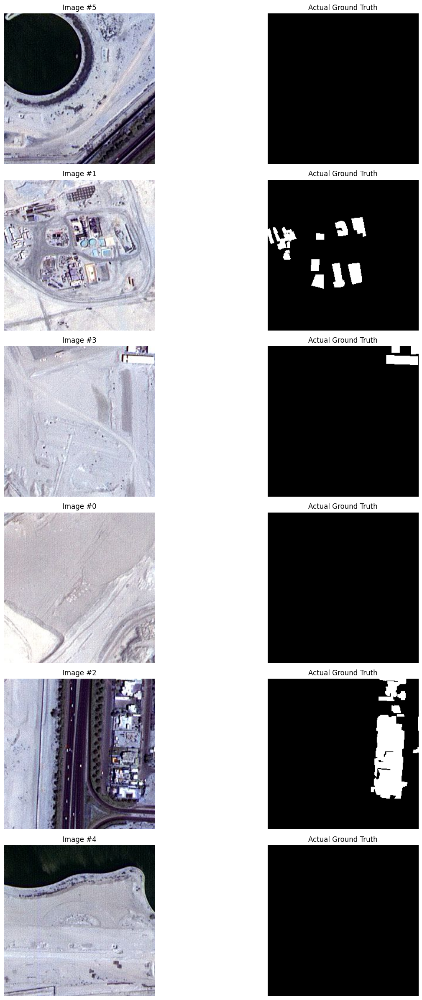

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# How many images do you want to test?
num_images_to_test = 6

# Get random indices from the test dataset
test_img_indices = random.sample(range(len(X_test)), num_images_to_test)

# Set up the plot
plt.figure(figsize=(20, 4 * num_images_to_test))

for i, img_index in enumerate(test_img_indices):
    # 1. Load the image and ground truth
    test_img = X_test[img_index]
    ground_truth = y_test[img_index]

    # 2. Predict (Must expand dims to add batch size of 1)
    test_img_input = np.expand_dims(test_img, 0)
    prediction = model.predict(test_img_input)[0,:,:,0]

    # 3. Apply threshold to convert probability (0.0-1.0) to binary (0 or 1)
    # Anything above 0.5 confidence is considered a "Building"
    predicted_mask = (prediction > 0.5).astype(np.uint8)

    # 4. Plotting
    # Original Image
    plt.subplot(num_images_to_test, 3, i*3 + 1)
    plt.title(f'Image #{img_index}')
    plt.imshow(test_img)
    plt.axis('off')

    # True Mask (What it should be)
    plt.subplot(num_images_to_test, 3, i*3 + 2)
    plt.title('Actual Ground Truth')
    plt.imshow(ground_truth[:,:,0], cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Task
Modify the plotting code in cell `DncTRBzaZSkJ` to add a third subplot for the `predicted_mask` to display the model's output alongside the original image and the ground truth mask, adjusting the subplot grid to 1x4 accordingly. Confirm that the plotting function now correctly displays the original image, the ground truth mask, and the predicted building mask for randomly selected test images.

## Modify Plotting to Include Predictions

### Subtask:
Update the existing plotting code in cell `DncTRBzaZSkJ` to add a third subplot for the `predicted_mask`. This will display the model's output alongside the original image and the ground truth mask for better comparison. The subplot grid will need to be adjusted accordingly (e.g., from 1x3 to 1x4 if adding one more column for the predicted mask).


**Reasoning**:
The subtask requires modifying the existing plotting code in cell `DncTRBzaZSkJ` to include a third subplot for the predicted mask. This involves adjusting the subplot grid to three columns and adding the code to display the `predicted_mask` with an appropriate title and colormap.



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


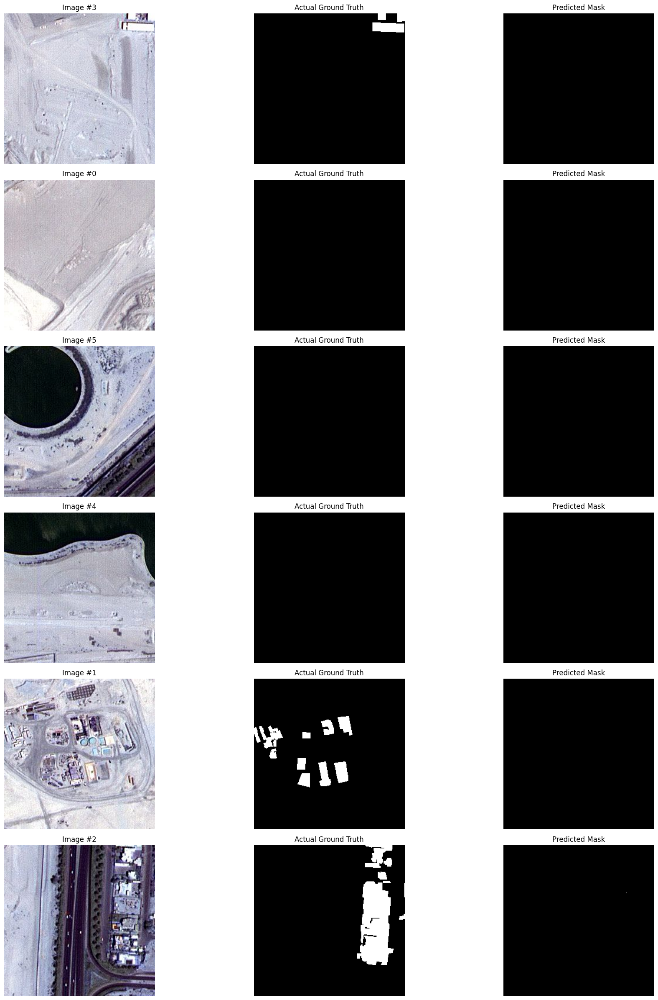

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# How many images do you want to test?
num_images_to_test = 6

# Get random indices from the test dataset
test_img_indices = random.sample(range(len(X_test)), num_images_to_test)

# Set up the plot
plt.figure(figsize=(20, 4 * num_images_to_test))

for i, img_index in enumerate(test_img_indices):
    # 1. Load the image and ground truth
    test_img = X_test[img_index]
    ground_truth = y_test[img_index]

    # 2. Predict (Must expand dims to add batch size of 1)
    test_img_input = np.expand_dims(test_img, 0)
    prediction = model.predict(test_img_input)[0,:,:,0]

    # 3. Apply threshold to convert probability (0.0-1.0) to binary (0 or 1)
    # Anything above 0.5 confidence is considered a "Building"
    predicted_mask = (prediction > 0.5).astype(np.uint8)

    # 4. Plotting
    # Original Image
    plt.subplot(num_images_to_test, 3, i*3 + 1)
    plt.title(f'Image #{img_index}')
    plt.imshow(test_img)
    plt.axis('off')

    # True Mask (What it should be)
    plt.subplot(num_images_to_test, 3, i*3 + 2)
    plt.title('Actual Ground Truth')
    plt.imshow(ground_truth[:,:,0], cmap='gray')
    plt.axis('off')

    # Predicted Mask
    plt.subplot(num_images_to_test, 3, i*3 + 3)
    plt.title('Predicted Mask')
    plt.imshow(predicted_mask, cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


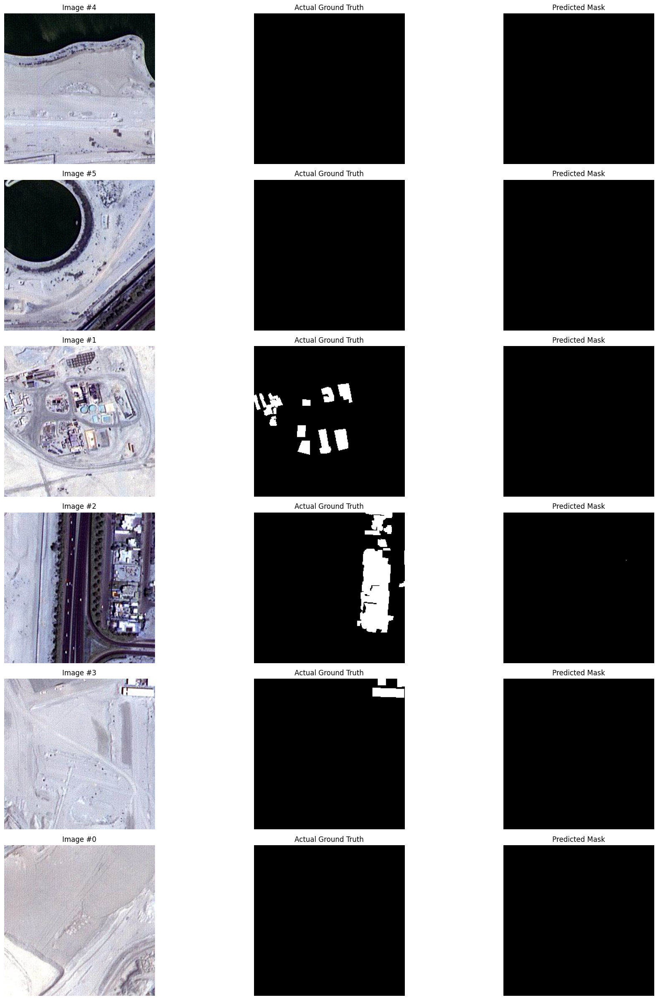

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# How many images do you want to test?
num_images_to_test = 6

# Get random indices from the test dataset
test_img_indices = random.sample(range(len(X_test)), num_images_to_test)

# Set up the plot
plt.figure(figsize=(20, 4 * num_images_to_test))

for i, img_index in enumerate(test_img_indices):
    # 1. Load the image and ground truth
    test_img = X_test[img_index]
    ground_truth = y_test[img_index]

    # 2. Predict (Must expand dims to add batch size of 1)
    test_img_input = np.expand_dims(test_img, 0)
    prediction = model.predict(test_img_input)[0,:,:,0]

    # 3. Apply threshold to convert probability (0.0-1.0) to binary (0 or 1)
    # Anything above 0.5 confidence is considered a "Building"
    predicted_mask = (prediction > 0.5).astype(np.uint8)

    # 4. Plotting
    # Original Image
    plt.subplot(num_images_to_test, 3, i*3 + 1)
    plt.title(f'Image #{img_index}')
    plt.imshow(test_img)
    plt.axis('off')

    # True Mask (What it should be)
    plt.subplot(num_images_to_test, 3, i*3 + 2)
    plt.title('Actual Ground Truth')
    plt.imshow(ground_truth[:,:,0], cmap='gray')
    plt.axis('off')

    # Predicted Mask
    plt.subplot(num_images_to_test, 3, i*3 + 3)
    plt.title('Predicted Mask')
    plt.imshow(predicted_mask, cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Task
Modify the data loading and preprocessing code in cell `pMa2Ma6h_0WX` to automatically identify and process all 'Tile X' subdirectories within the `root_directory`. Iterate through each identified tile, load its images and corresponding masks, and apply the existing patchification and label conversion logic to populate the `image_dataset` and `mask_dataset` lists. Finally, update the print statements to display the total number of tiles processed and the cumulative size of `image_dataset` and `mask_dataset` after all tiles have been integrated.

## Identify All Tile Directories

### Subtask:
Scan the `root_directory` to identify all available subdirectories that follow the 'Tile X' naming convention. Collect a list of all these tile directories.


**Reasoning**:
The subtask requires identifying all tile directories within the `root_directory`. I will use `os.listdir` to get all entries, then filter them to include only directories whose names start with 'Tile '.



In [ ]:
import os

tile_directories = []
for entry in os.listdir(root_directory):
    full_path = os.path.join(root_directory, entry)
    if os.path.isdir(full_path) and entry.startswith('Tile '):
        tile_directories.append(full_path)

print(f"Identified tile directories: {tile_directories}")

Identified tile directories: ['Semantic segmentation dataset/Tile 6', 'Semantic segmentation dataset/Tile 5', 'Semantic segmentation dataset/Tile 4', 'Semantic segmentation dataset/Tile 3', 'Semantic segmentation dataset/Tile 8', 'Semantic segmentation dataset/Tile 2', 'Semantic segmentation dataset/Tile 1', 'Semantic segmentation dataset/Tile 7']


## Iterate and Process All Tiles

### Subtask:
Modify the data loading loop to iterate through *every* identified tile directory. For each tile, load its images and corresponding masks, then apply the existing patchification and label conversion logic to populate the `image_dataset` and `mask_dataset` lists.


**Reasoning**:
The previous code block identified tile directories. Now, I will implement the main loop to process all these tile directories, loading images and masks, applying patchification and label conversion, and then performing the train/validation/test split as instructed. This will consolidate the data from all tiles into the datasets.



In [ ]:
root_directory = 'Semantic segmentation dataset'
patch_size = 256

image_dataset = []
mask_dataset = []

# Identify all tile directories (re-running the logic from the previous step for completeness)
tile_directories = []
for entry in os.listdir(root_directory):
    full_path = os.path.join(root_directory, entry)
    if os.path.isdir(full_path) and entry.startswith('Tile '):
        tile_directories.append(entry) # Store just the directory name, not the full path

print(f"Processing {len(tile_directories)} tile directories. This may take a moment...")

for tile_name in sorted(tile_directories):
    print(f"  Processing {tile_name}...")
    current_tile_path = os.path.join(root_directory, tile_name)
    images = sorted(os.listdir(os.path.join(current_tile_path, "images")))

    for i, image_name in enumerate(images):
        if image_name.endswith(".jpg"):
            # Load Image
            image = cv2.imread(os.path.join(current_tile_path, "images", image_name), 1)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            SIZE_X = (image.shape[1]//patch_size)*patch_size
            SIZE_Y = (image.shape[0]//patch_size)*patch_size
            image = Image.fromarray(image)
            image = image.crop((0,0,SIZE_X,SIZE_Y))
            image = np.array(image)

            # Patchify Image
            patches_img = patchify(image, (patch_size, patch_size, 3), step=patch_size)

            # Load Mask
            mask = cv2.imread(os.path.join(current_tile_path, "masks", image_name.replace(".jpg", ".png")), 1)
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
            mask = Image.fromarray(mask)
            mask = mask.crop((0,0,SIZE_X,SIZE_Y))
            mask = np.array(mask)

            # Patchify Mask
            patches_mask = patchify(mask, (patch_size, patch_size, 3), step=patch_size)

            for p_i in range(patches_img.shape[0]):
                for p_j in range(patches_img.shape[1]):
                    single_patch_img = patches_img[p_i,p_j,:,:]
                    single_patch_mask = patches_mask[p_i,p_j,:,:]

                    # Normalize image to 0-1
                    single_patch_img = single_patch_img[0] / 255.
                    single_patch_mask = single_patch_mask[0]

                    image_dataset.append(single_patch_img)
                    mask_dataset.append(single_patch_mask)

# Convert lists to numpy arrays
image_dataset = np.array(image_dataset)
mask_dataset = np.array(mask_dataset)

# Convert Hex classes to Integer labels (Building class is usually distinct color)
def rgb_to_2D_label(label):
    label_seg = np.zeros(label.shape,dtype=np.uint8)
    label_seg [np.all(label == [60, 16, 152], axis=-1)] = 1 # Building Class
    label_seg = label_seg[:,:,0]  # Just take one channel since it's a mask
    return label_seg

labels = []
for i in range(mask_dataset.shape[0]):
    label = rgb_to_2D_label(mask_dataset[i])
    labels.append(label)

labels = np.array(labels)
labels = np.expand_dims(labels, axis=3)

# SPLIT DATASET
X_train, X_test, y_train, y_test = train_test_split(image_dataset, labels, test_size=0.20, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.50, random_state=42)

print(f"Total processed patches: {image_dataset.shape[0]}")
print(f"Train Size: {X_train.shape}")
print(f"Val Size: {X_val.shape}")
print(f"Test Size: {X_test.shape}")


Processing 8 tile directories. This may take a moment...
  Processing Tile 1...
  Processing Tile 2...
  Processing Tile 3...
  Processing Tile 4...
  Processing Tile 5...
  Processing Tile 6...
  Processing Tile 7...
  Processing Tile 8...
Total processed patches: 1305
Train Size: (1044, 256, 256, 3)
Val Size: (130, 256, 256, 3)
Test Size: (131, 256, 256, 3)


Predicting and plotting 15 images...


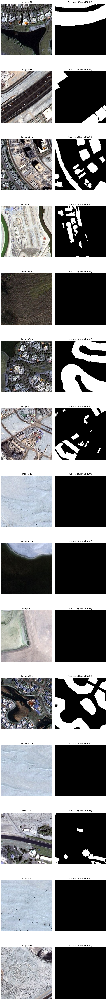

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# --- CONFIGURATION ---
# We will check 15 random images
num_samples = 15

# Ensure we have enough test data
if len(X_test) < num_samples:
    print(f"Warning: Only {len(X_test)} test images available.")
    num_samples = len(X_test)

# Pick random indices from the X_test array
random_indices = random.sample(range(len(X_test)), num_samples)

# Setup a large figure for plotting (Rows = samples, Cols = 3)
plt.figure(figsize=(12, 5 * num_samples))

print(f"Predicting and plotting {num_samples} images...")

for i, idx in enumerate(random_indices):
    # 1. Get the Image and True Mask
    test_img = X_test[idx]
    ground_truth = y_test[idx] # Shape is (256, 256, 1)

    # 2. PREDICT
    # Expand dimensions because model expects a batch (1, 256, 256, 3)
    input_img = np.expand_dims(test_img, axis=0)
    prediction = model.predict(input_img, verbose=0)

    # 3. Process Prediction
    # The output is (1, 256, 256, 1). We take the first image [0]
    # and squeeze the last dimension to get (256, 256)
    pred_mask = prediction[0]

    # Thresholding: Convert probabilities to binary (0 or 1)
    # If confidence > 0.5, it is a building (1), else background (0)
    pred_mask_binary = (pred_mask > 0.5).astype(np.uint8)

    # --- VISUALIZATION ---

    # Column 1: Original Image
    plt.subplot(num_samples, 3, i*3 + 1)
    plt.title(f"Image #{idx}", fontsize=10)
    plt.imshow(test_img)
    plt.axis('off')

    # Column 2: Ground Truth (What it should be)
    plt.subplot(num_samples, 3, i*3 + 2)
    plt.title("True Mask (Ground Truth)", fontsize=10)
    # y_test is (256, 256, 1), so we squeeze to (256, 256) for display
    plt.imshow(np.squeeze(ground_truth), cmap='gray')
    plt.axis('off')

    # Column 3: AI Prediction
    plt.subplot(num_samples, 3, i*3 + 3)
    plt.title("AI Prediction", fontsize=10)
    plt.imshow(np.squeeze(pred_mask_binary), cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

Predicting and plotting 20 images...


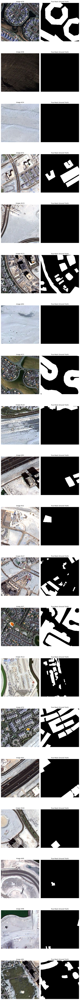

In [22]:
import random
import matplotlib.pyplot as plt
import numpy as np

# --- CONFIGURATION ---
# We will check 15 random images
num_samples = 20

# Ensure we have enough test data
if len(X_test) < num_samples:
    print(f"Warning: Only {len(X_test)} test images available.")
    num_samples = len(X_test)

# Pick random indices from the X_test array
random_indices = random.sample(range(len(X_test)), num_samples)

# Setup a large figure for plotting (Rows = samples, Cols = 3)
plt.figure(figsize=(12, 5 * num_samples))

print(f"Predicting and plotting {num_samples} images...")

for i, idx in enumerate(random_indices):
    # 1. Get the Image and True Mask
    test_img = X_test[idx]
    ground_truth = y_test[idx] # Shape is (256, 256, 1)

    # 2. PREDICT
    # Expand dimensions because model expects a batch (1, 256, 256, 3)
    input_img = np.expand_dims(test_img, axis=0)
    prediction = model.predict(input_img, verbose=0)

    # 3. Process Prediction
    # The output is (1, 256, 256, 1). We take the first image [0]
    # and squeeze the last dimension to get (256, 256)
    pred_mask = prediction[0]

    # Thresholding: Convert probabilities to binary (0 or 1)
    # If confidence > 0.5, it is a building (1), else background (0)
    pred_mask_binary = (pred_mask > 0.5).astype(np.uint8)

    # --- VISUALIZATION ---

    # Column 1: Original Image
    plt.subplot(num_samples, 3, i*3 + 1)
    plt.title(f"Image #{idx}", fontsize=10)
    plt.imshow(test_img)
    plt.axis('off')

    # Column 2: Ground Truth (What it should be)
    plt.subplot(num_samples, 3, i*3 + 2)
    plt.title("True Mask (Ground Truth)", fontsize=10)
    # y_test is (256, 256, 1), so we squeeze to (256, 256) for display
    plt.imshow(np.squeeze(ground_truth), cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()